<a href="https://colab.research.google.com/github/nakul-jindal/dcgan-in-pytorch/blob/master/DCgan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import torch
import torchvision
import torch.nn as nn                       # All neural network modules, nn.Linear, nn.Conv2d, BatchNorm, Loss functions
import torch.optim as optim                 # For all Optimization algorithms, SGD, Adam, etc.
import torchvision.datasets as datasets     # Has standard datasets we can import in a nice way
import torchvision.transforms as transforms # Transformations we can perform on our dataset
import torchvision.utils as vutils          # image viewing
from torch.utils.data import DataLoader     # Gives easier dataset managment and creates mini batches
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

In [0]:
# Hyperparameters
lr = 0.0002
batch_size = 128
image_size = 64
channels_img = 1
channels_noise = 100
num_epochs = 3

In [0]:
# For how many channels Generator and Discriminator should use
features_d = 128
features_g = 128

In [0]:
my_transforms = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5,),(0.5,)),
    ])

dataset = datasets.MNIST(root='dataset/', train=True, transform=my_transforms, download=True)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=2)


In [23]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print (device)

cuda


In [0]:
class Generator(nn.Module):
    def __init__(self, channels_noise, channels_img, features_g):
        super(Generator, self).__init__()
        
        self.net = nn.Sequential(
            
            nn.ConvTranspose2d(channels_noise, features_g*8, kernel_size=4, stride=1, padding=0 , bias = False ),
            nn.BatchNorm2d(features_g*8),
              nn.ReLU(True),
            
            nn.ConvTranspose2d(features_g*8, features_g*4, kernel_size=4, stride=2, padding=1 , bias = False ),
            nn.BatchNorm2d(features_g*4),
              nn.ReLU(True),
            
            nn.ConvTranspose2d(features_g*4, features_g*2, kernel_size=4, stride=2, padding=1  , bias = False),
            nn.BatchNorm2d(features_g*2),
              nn.ReLU(True),
            
            nn.ConvTranspose2d(features_g*2, features_g, kernel_size=4, stride=2, padding=1  , bias = False),
            nn.BatchNorm2d(features_g),
              nn.ReLU(True),
            
            nn.ConvTranspose2d(features_g, channels_img, kernel_size=4, stride=2, padding=1 , bias = False ),
            nn.Tanh()
            )      
    
    def forward(self, x):
        return self.net(x)

In [0]:
class Discriminator(nn.Module):
    def __init__(self, channels_img, features_d):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            
            nn.Conv2d(channels_img, features_d, kernel_size=4, stride=2, padding=1 , bias = False ),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(features_d, features_d*2, kernel_size=4, stride=2, padding=1 , bias = False ),
            nn.BatchNorm2d(features_d*2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(features_d*2, features_d*4, kernel_size=4, stride=2, padding=1 , bias = False ),
            nn.BatchNorm2d(features_d*4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(features_d*4, features_d*8, kernel_size=4, stride=2, padding=1 , bias = False ),
            nn.BatchNorm2d(features_d*8),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(features_d*8, 1, kernel_size=4, stride=2, padding=0 , bias = False ),
            nn.Sigmoid()
            )  
    
    def forward(self, x):
        return self.net(x)

In [0]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [0]:
netD = Discriminator(channels_img, features_d).to(device)
netG = Generator(channels_noise, channels_img, features_g).to(device)
netG=netG.apply(weights_init)
netD=netD.apply(weights_init)

In [0]:
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(0.5, 0.999) )
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(0.5, 0.999) )

In [0]:
criterion = nn.BCELoss()

In [0]:
real_label = 1
fake_label = 0

fixed_noise = torch.randn(batch_size, channels_noise, 1, 1).to(device)

In [31]:
img_list = []
G_losses = []
D_losses = []

for epoch in range(num_epochs):
    for batch_idx, (data, targets) in enumerate(dataloader):
        data = data.to(device)
        batch_size = data.shape[0]
        
        ### Train Discriminator: max log(D(x)) + log(1 - D(G(z)))
        netD.zero_grad()
        label = (torch.ones(batch_size)*0.9).to(device)
        output = netD(data).view(-1)
        lossD_real = criterion(output, label)
        D_x = output.mean().item()
        
        noise = torch.randn(batch_size, channels_noise, 1, 1).to(device)
        fake = netG(noise)
        label = (torch.ones(batch_size)*0.1).to(device)
        
        output = netD(fake.detach()).view(-1)
        lossD_fake = criterion(output, label)
        
        lossD = lossD_real + lossD_fake
        lossD.backward()
        optimizerD.step()
        
        ### Train Generator: max log(D(G(z)))
        netG.zero_grad()
        label = torch.ones(batch_size).to(device)
        output = netD(fake).reshape(-1)
        lossG = criterion(output, label)
        lossG.backward()
        optimizerG.step()
        D_G_x = output.mean().item()
        
        # Print losses ocassionally 
        if batch_idx % 100 == 0:
            print(f'Epoch [{epoch}/{num_epochs}] Batch {batch_idx}/{len(dataloader)}  Loss D: {lossD:.4f}  loss G: {lossG:.4f}  D(x): {D_x:.4f}  D(G(z)): {D_G_x:.4f} ')
            G_losses.append(lossG.item())
            D_losses.append(lossD.item())
            
            # Check how the generator is doing by saving G's output on fixed_noise
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))


Epoch [0/10] Batch 0/469  Loss D: 2.4037  loss G: 17.6629  D(x): 0.5803  D(G(z)): 0.0000 
Epoch [0/10] Batch 100/469  Loss D: 1.7666  loss G: 5.7178  D(x): 0.4722  D(G(z)): 0.0233 
Epoch [0/10] Batch 200/469  Loss D: 0.8253  loss G: 1.6081  D(x): 0.7320  D(G(z)): 0.2347 
Epoch [0/10] Batch 300/469  Loss D: 0.7469  loss G: 1.7703  D(x): 0.7895  D(G(z)): 0.1980 
Epoch [0/10] Batch 400/469  Loss D: 1.2015  loss G: 2.1743  D(x): 0.7872  D(G(z)): 0.1474 
Epoch [1/10] Batch 0/469  Loss D: 0.9597  loss G: 2.5788  D(x): 0.8119  D(G(z)): 0.0975 
Epoch [1/10] Batch 100/469  Loss D: 0.9662  loss G: 0.9695  D(x): 0.5916  D(G(z)): 0.4132 
Epoch [1/10] Batch 200/469  Loss D: 1.1126  loss G: 2.6450  D(x): 0.9014  D(G(z)): 0.0855 
Epoch [1/10] Batch 300/469  Loss D: 1.7166  loss G: 0.8685  D(x): 0.3040  D(G(z)): 0.4686 
Epoch [1/10] Batch 400/469  Loss D: 0.9749  loss G: 1.0099  D(x): 0.5808  D(G(z)): 0.3984 
Epoch [2/10] Batch 0/469  Loss D: 0.8773  loss G: 1.0902  D(x): 0.6633  D(G(z)): 0.3760 
Epoc

In [0]:
with torch.no_grad():
                fake = netG(fixed_noise)
                
                img_grid_real = torchvision.utils.make_grid(data[:32], normalize=True).cpu()
                img_grid_fake = torchvision.utils.make_grid(fake[:32], normalize=True).cpu()

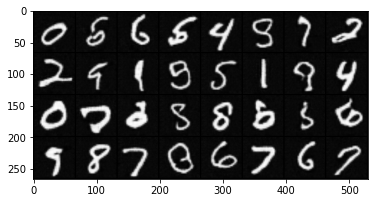

In [33]:
plt.imshow(img_grid_fake.permute(1, 2, 0))

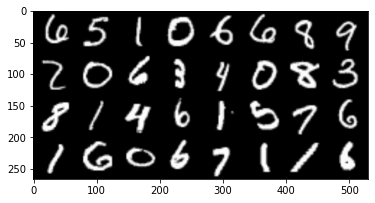

In [34]:
plt.imshow(img_grid_real.permute(1, 2, 0))

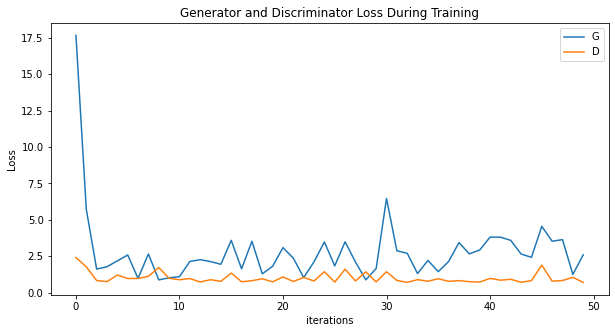

In [35]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

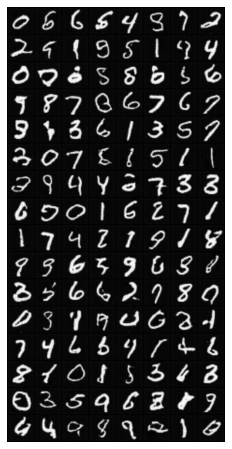

In [36]:
import numpy as np
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())